imports

In [1]:
import dataLoader3
from configParser import ConfigParser

params

In [2]:
# defining global variables
experimentName = "test_22987_suffix50_11_dataLoader3"
experimentName2 = None # "test_22987_suffix50_11_splitTest_3"
list_of_sizes_of_interest = [] # 20,50,100

params = ConfigParser(experimentName).read()
params2 = ConfigParser(experimentName2).read()
print(params)
print(params2)

{'image_path': '/data/BGNN_data/INHS_cropped', 'suffix': '50_11_testsplit', 'training_count': 0.64, 'validation_count': 0.16, 'usePretrained': True, 'imageDimension': 28, 'n_channels': 1, 'useZCAWhitening': False, 'batchSize': 200, 'n_epochs': 1000, 'numOfTrials': 3, 'kernels': [16, 32], 'kernelSize': 5, 'patience': 50}
{'image_path': '/data/BGNN_data/INHS_cropped', 'suffix': '50_11_testsplit', 'training_count': 0.64, 'validation_count': 0.16, 'usePretrained': True, 'imageDimension': 56, 'n_channels': 1, 'useZCAWhitening': False, 'batchSize': 200, 'n_epochs': 1000, 'numOfTrials': 3, 'kernels': [16, 32], 'kernelSize': 5, 'patience': 50}


pre-defined strings

In [3]:
cleaned_species_csv_fileName = "cleaned_metadata.csv"
species_csv_fileName_header = "fileName"
species_csv_scientificName_header = "scientificName"
species_csv_Genus_header = "Genus"
species_csv_Family_header = "Family"
image_subpath = "/images"
species_csv_usedColumns = [species_csv_fileName_header,
                          species_csv_scientificName_header,
                          species_csv_Genus_header,
                          species_csv_Family_header]

Create dataset

In [4]:
datasetManager = dataLoader3.datasetManager(experimentName)
datasetManager.updateParams(params)
dataset = datasetManager.getDataset()

N/A% (0 of 272) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--

Loading dataset...


  1% (4 of 272) |                        | Elapsed Time: 0:00:00 ETA:   0:00:08

Going through image files


100% (272 of 272) |######################| Elapsed Time: 0:00:19 Time:  0:00:19


try to reload dataset

In [5]:
dataset = datasetManager.getDataset()
speciesList = dataset.getSpeciesList()
numberOfSpecies = len(speciesList)
print("Number of species = ", numberOfSpecies)

Number of species =  11


Try to reload dataset with changed params

In [6]:
if experimentName2 is not None:
    datasetManager = dataLoader3.datasetManager(experimentName2)
    datasetManager.updateParams(params2)
    dataset = datasetManager.getDataset()
    numberOfSpecies = len(speciesList)
    print("Number of species = ", numberOfSpecies)

  1% (4 of 272) |                        | Elapsed Time: 0:00:00 ETA:   0:00:06

Loading dataset...
Going through image files


100% (272 of 272) |######################| Elapsed Time: 0:00:18 Time:  0:00:18


Number of species =  11


Try same experiment but different dataset params

In [7]:
if experimentName2 is not None:
    params2['useZCAWhitening'] = not params2['useZCAWhitening']
    print(params2)
    datasetManager.updateParams(params2)
    dataset = datasetManager.getDataset()
    numberOfSpecies = len(speciesList)
    print("Number of species = ", numberOfSpecies)

N/A% (0 of 272) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--

{'image_path': '/data/BGNN_data/INHS_cropped', 'suffix': '50_11_testsplit', 'training_count': 0.64, 'validation_count': 0.16, 'usePretrained': True, 'imageDimension': 56, 'n_channels': 1, 'useZCAWhitening': True, 'batchSize': 200, 'n_epochs': 1000, 'numOfTrials': 3, 'kernels': [16, 32], 'kernelSize': 5, 'patience': 50}
Loading dataset...


  1% (4 of 272) |                        | Elapsed Time: 0:00:00 ETA:   0:00:07

Going through image files


100% (272 of 272) |######################| Elapsed Time: 0:00:18 Time:  0:00:18


Number of species =  11


Get old dataset back

In [8]:
datasetManager = dataLoader3.datasetManager(experimentName)
datasetManager.updateParams(params)
dataset = datasetManager.getDataset()
print(speciesList)

['Lepomis cyanellus', 'Lepomis auritus', 'Carassius auratus', 'Cyprinus carpio', 'Esox americanus', 'Esox lucius', 'Noturus gyrinus', 'Noturus exilis', 'Noturus flavus', 'Noturus eleutherus', 'Noturus insignis']


Data Loader

In [9]:
train_loader, validation_loader, test_loader = datasetManager.getLoaders()

trainingFileNames = []
valFileNames = []
testFileNames = []

for batch in train_loader:
    print(batch['class'])
    print(batch['fileName'])

tensor([ 0,  4,  6,  6,  3,  6,  7,  4,  3,  8,  3,  8,  2,  0,  2,  0,  6,  3,
         3,  4,  3,  1,  0,  1,  8,  0,  8,  3,  6,  4,  3,  3,  6,  6,  2,  4,
         7,  3,  6,  0,  4,  0,  8,  6,  1,  8,  7,  0,  4,  6,  3,  3,  3,  2,
         2,  4,  3,  3,  0,  8,  0,  8,  3,  4,  5,  4,  6,  5,  3,  5,  6,  9,
         4,  3,  4,  4,  8,  0,  0,  0,  4,  4,  4,  2,  4,  6,  4,  9,  1,  5,
         0,  7,  3,  3,  6,  0,  0,  0,  2,  4,  4,  6, 10,  0,  8,  0,  4,  6,
         0,  0,  4,  3,  9,  4,  4,  8,  5,  0,  3,  5,  3,  1,  1,  8,  6,  8,
        10,  6,  0,  0,  1,  6,  4,  6,  3,  0,  8,  2,  3,  4,  8,  3, 10,  4,
         1,  8,  0,  8,  8,  4,  4,  3,  4,  8,  3,  8,  3,  0,  7,  4,  6,  8,
         6,  0,  4,  3,  3,  3,  6,  0,  0,  0,  0])
['INHS_FISH_89111.jpg', 'INHS_FISH_108140.jpg', 'INHS_FISH_17424.jpg', 'INHS_FISH_96502.jpg', 'INHS_FISH_23133.jpg', 'INHS_FISH_57607.jpg', 'INHS_FISH_68083_2.jpg', 'INHS_FISH_39616.jpg', 'INHS_FISH_89664.jpg', 'INHS_FISH_87328

In [10]:
for batch in validation_loader:
    print(batch['class'])
    print(batch['fileName'])

tensor([ 6,  0,  3,  4,  4,  6,  4,  0,  0,  0,  0,  8,  5,  8,  0,  3,  4,  3,
         2,  2,  4,  0,  8,  4,  0,  1,  8,  3,  3,  8,  6,  4,  1,  3,  3,  5,
        10,  9,  4,  3,  7,  6,  6,  6])
['INHS_FISH_94860.jpg', 'INHS_FISH_47587.jpg', 'INHS_FISH_77404.jpg', 'INHS_FISH_30732.jpg', 'INHS_FISH_94727.jpg', 'INHS_FISH_2198.jpg', 'INHS_FISH_46224.jpg', 'INHS_FISH_105265.jpg', 'INHS_FISH_30215.jpg', 'INHS_FISH_65024.jpg', 'INHS_FISH_51437.jpg', 'INHS_FISH_102623.jpg', 'INHS_FISH_64109.jpg', 'INHS_FISH_37733.jpg', 'INHS_FISH_98732.jpg', 'INHS_FISH_24258.jpg', 'INHS_FISH_45432.jpg', 'INHS_FISH_77561.jpg', 'INHS_FISH_88453.jpg', 'INHS_FISH_000710.jpg', 'INHS_FISH_98495.jpg', 'INHS_FISH_32456.jpg', 'INHS_FISH_109100.jpg', 'INHS_FISH_5983.jpg', 'INHS_FISH_1587.jpg', 'INHS_FISH_51429.jpg', 'INHS_FISH_30570.jpg', 'INHS_FISH_14454.jpg', 'INHS_FISH_58837.jpg', 'INHS_FISH_85433.jpg', 'INHS_FISH_21565.jpg', 'INHS_FISH_53152.jpg', 'INHS_FISH_46991.jpg', 'INHS_FISH_12568.jpg', 'INHS_FISH_2234

In [11]:
for batch in test_loader:
    print(batch['class'])
    print(batch['fileName'])

tensor([ 4,  4,  8,  6,  4,  6,  1,  4,  2,  3,  9,  3,  8,  3,  8,  5,  6,  3,
         0,  3,  4,  0,  0,  4,  3,  0,  7,  2,  0,  6,  6,  0,  0, 10,  8,  4,
         6,  3,  1,  0,  7,  2,  6,  8,  3,  0,  8,  0,  3,  4,  8,  5,  3,  4,
         1,  4])
['INHS_FISH_63090.jpg', 'INHS_FISH_13110.jpg', 'INHS_FISH_57524.jpg', 'INHS_FISH_108535.jpg', 'INHS_FISH_84741.jpg', 'INHS_FISH_64705.jpg', 'INHS_FISH_86895.jpg', 'INHS_FISH_95180.jpg', 'INHS_FISH_92825.jpg', 'INHS_FISH_99944.jpg', 'INHS_FISH_16862.jpg', 'INHS_FISH_20480.jpg', 'INHS_FISH_1939.jpg', 'INHS_FISH_7761.jpg', 'INHS_FISH_31009.jpg', 'INHS_FISH_77457.jpg', 'INHS_FISH_103738.jpg', 'INHS_FISH_15857.jpg', 'INHS_FISH_20523.jpg', 'INHS_FISH_017196.jpg', 'INHS_FISH_96417.jpg', 'INHS_FISH_4798.jpg', 'INHS_FISH_98964.jpg', 'INHS_FISH_81070.jpg', 'INHS_FISH_32929.jpg', 'INHS_FISH_95087.jpg', 'INHS_FISH_61749.jpg', 'INHS_FISH_026162.jpg', 'INHS_FISH_30228.jpg', 'INHS_FISH_126.jpg', 'INHS_FISH_24127.jpg', 'INHS_FISH_47662.jpg', 'INHS_F

Try to reload dataloader. You should get same indices.

In [12]:
train_loader, validation_loader, test_loader = datasetManager.getLoaders()

Loading saved dataloaders...


In [13]:
for batch in train_loader:
    print(batch['class'])
    print(batch['fileName'])

tensor([ 3,  7,  4,  4,  9,  1,  5,  4,  6,  4,  0,  3,  2,  3,  6,  3,  6,  8,
         8,  8,  3,  2,  4,  0,  0,  8,  1,  4,  3,  4,  2,  8,  3,  2,  6,  6,
         3,  6,  6,  8,  0,  0,  4,  0,  7,  3,  0,  0,  8, 10,  2,  3,  3,  2,
         0,  6,  3,  4,  0,  0,  6,  0,  8,  6,  0, 10,  0,  3,  5,  5,  4,  1,
         6,  8,  4,  4,  4,  2,  8,  6,  7,  3,  0,  0,  6,  8,  1,  0,  5,  6,
         3,  4,  6,  4, 10,  3,  3,  3,  4,  0,  3,  8,  6,  1,  3,  4,  1,  8,
         4,  0,  9,  6,  3,  8,  3,  0,  4,  6,  6,  4,  2,  8,  6,  3,  4,  4,
         7,  3,  5,  1,  3,  4,  0,  0,  0,  7,  0,  5,  0,  8,  3,  4,  0,  8,
         6,  4,  4,  3,  3,  4,  8,  3,  4,  8,  0,  4,  8,  4,  6,  0,  4,  4,
         0,  1,  6,  0,  3,  3,  0,  3,  0,  8,  9])
['INHS_FISH_90518.jpg', 'INHS_FISH_18094.jpg', 'INHS_FISH_3003.jpg', 'INHS_FISH_95243.jpg', 'INHS_FISH_27397.jpg', 'INHS_FISH_87500.jpg', 'INHS_FISH_91030.jpg', 'INHS_FISH_15323.jpg', 'INHS_FISH_29582.jpg', 'INHS_FISH_2237.jpg'

Plot information about the dataset

        scientificName  count
0   Noturus eleutherus      4
1     Noturus insignis      5
2       Noturus exilis      8
3          Esox lucius     10
4    Carassius auratus     13
5      Lepomis auritus     13
6       Noturus flavus     33
7      Noturus gyrinus     36
8      Cyprinus carpio     50
9      Esox americanus     50
10   Lepomis cyanellus     50


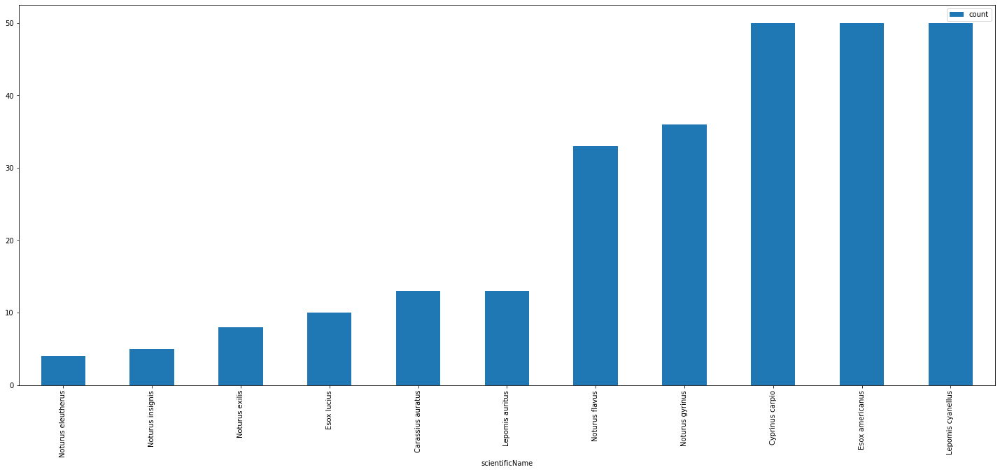

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

suffix = str(params["suffix"])+"/" if ("suffix" in params and params["suffix"] is not None) else ""

full_path = params["image_path"] + "/" + suffix + "count_per_species.csv"
species_count_table = pd.read_csv(full_path).rename(columns={species_csv_fileName_header: "count"})
print(species_count_table)
species_count_table.plot.bar(x=species_csv_scientificName_header, y='count', rot=90, figsize=(25, 10))
plt.savefig(params["image_path"] + "/" + suffix+ 'count_per_species.pdf')

          Family      Genus  count
1     Cyprinidae  Carassius     13
2     Cyprinidae   Cyprinus     50
3       Esocidae       Esox     60
0  Centrarchidae    Lepomis     63
4    Ictaluridae    Noturus     86
               count
Family              
Esocidae          60
Centrarchidae     63
Cyprinidae        63
Ictaluridae       86


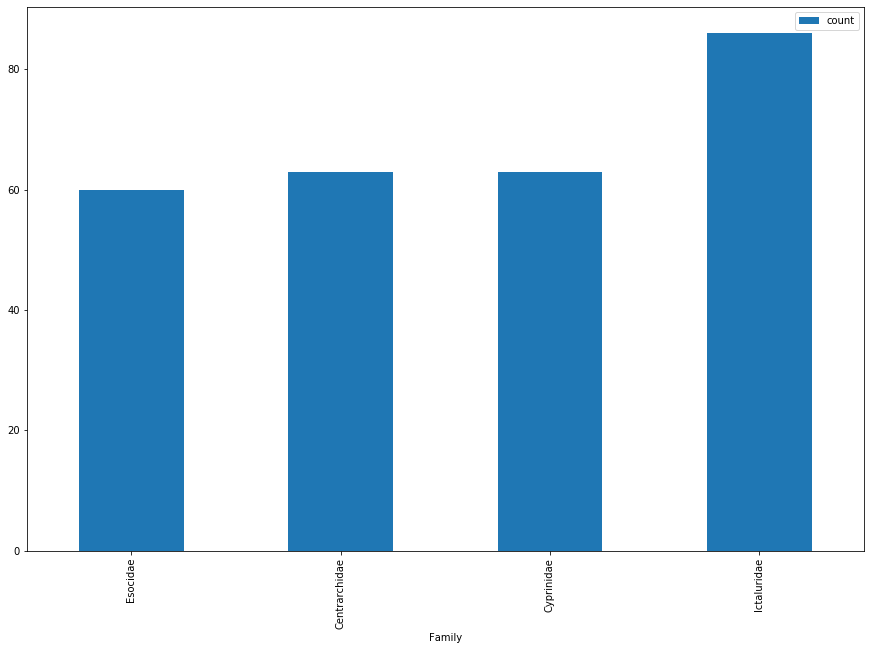

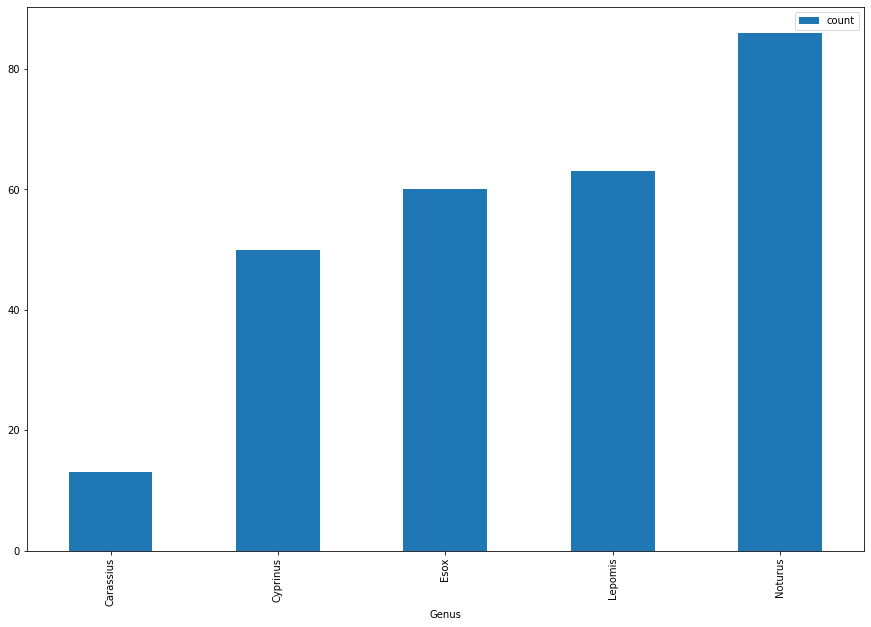

In [15]:
full_path = params["image_path"]+ "/" + suffix + "count_per_family_genis.csv"
family_genis_count_table = pd.read_csv(full_path).rename(columns={species_csv_fileName_header: "count"}).sort_values(by=['count'])
print(family_genis_count_table)
print(family_genis_count_table.groupby(species_csv_Family_header).agg('sum').sort_values(by=['count']))
family_genis_count_table.groupby(species_csv_Family_header).agg('sum').sort_values(by=['count']).plot.bar(rot=90, figsize=(15, 10))
plt.savefig(params["image_path"]+ "/" + suffix + 'count_per_family.pdf')
family_genis_count_table.groupby(species_csv_Genus_header).agg('sum').sort_values(by=['count']).plot.bar(rot=90, figsize=(15, 10))
plt.savefig(params["image_path"]+ "/" + suffix + 'count_per_genis.pdf')

Get count matrix

Genus               Carassius  Cyprinus  Esox  Lepomis  Noturus
scientificName                                                 
Carassius auratus          13         0     0        0        0
Cyprinus carpio             0        50     0        0        0
Esox americanus             0         0    50        0        0
Esox lucius                 0         0    10        0        0
Lepomis auritus             0         0     0       13        0
Lepomis cyanellus           0         0     0       50        0
Noturus eleutherus          0         0     0        0        4
Noturus exilis              0         0     0        0        8
Noturus flavus              0         0     0        0       33
Noturus gyrinus             0         0     0        0       36
Noturus insignis            0         0     0        0        5


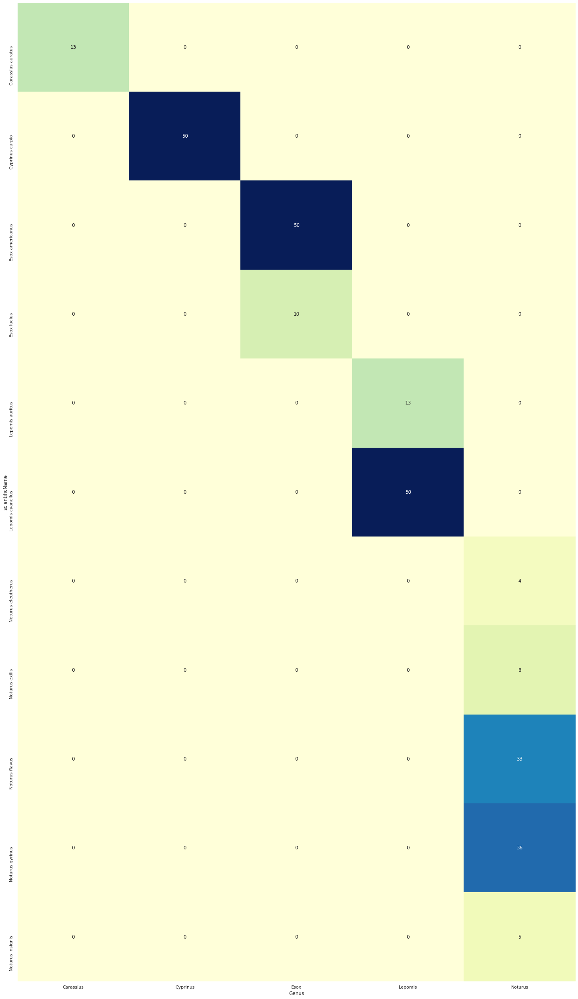

In [16]:
import numpy as np
import seaborn as sns; sns.set()

cleaned_metadata = pd.read_csv(params["image_path"]+ "/" + suffix + cleaned_species_csv_fileName, sep='\t')
species_genis_matrix = cleaned_metadata.groupby([species_csv_scientificName_header, species_csv_Genus_header]).size().unstack(fill_value=0)

print(species_genis_matrix)
fig, ax = plt.subplots(figsize=(25,45))
sns.heatmap(species_genis_matrix, annot=True, fmt="d", ax=ax, cmap="YlGnBu", cbar=False)
plt.savefig(params["image_path"]+ "/" + suffix + 'species_genis_matrix.pdf')
species_genis_matrix.to_csv(params["image_path"]+ "/" + suffix+ 'species_genis_matrix.csv', sep='\t')

Get most frequent Genuses and clip them to a certain size

In [17]:
import os
for size in list_of_sizes_of_interest:
    sub_path = params["image_path"]+"/"+str(size)
    if not os.path.exists(sub_path):
            os.makedirs(sub_path)
    # find species with image count more than a threshold
    genus_groupedby_species = cleaned_metadata.groupby([species_csv_Genus_header, species_csv_scientificName_header]).filter(lambda x: x[species_csv_fileName_header].count() >= size)
    genus_groupedby_species = genus_groupedby_species.groupby([species_csv_Genus_header, species_csv_scientificName_header]).agg(len).rename(columns={species_csv_fileName_header: "count"})['count']
    print("\nSpecies of sample size", size)
    print(genus_groupedby_species)
    # get n top for each species
    species_list = genus_groupedby_species.reset_index()['scientificName'].unique()
    trimmed_cleaned_metadata = cleaned_metadata.loc[cleaned_metadata[species_csv_scientificName_header].isin(species_list)].groupby(species_csv_scientificName_header).head(size)
    print(trimmed_cleaned_metadata)
    trimmed_cleaned_metadata.to_csv(sub_path+ '/'+cleaned_species_csv_fileName, sep="\t", index=False)
    



Get image size statistics

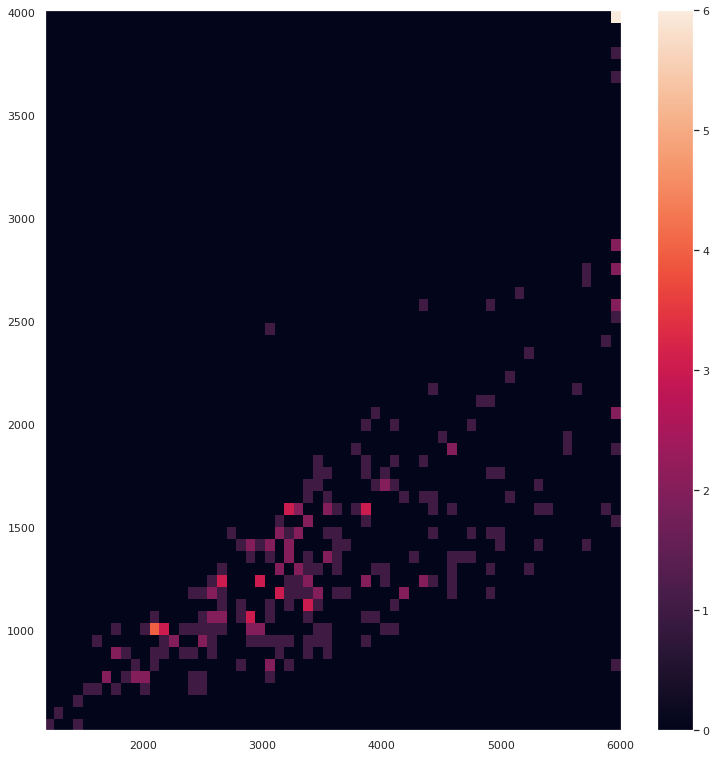

In [18]:
import PIL
from PIL import Image

# Get params
data_root = params["image_path"]
suffix = str(params["suffix"])+"/" if ("suffix" in params and params["suffix"] is not None) else ""

# Get file
cleaned_species_csv_fileName_withsuffix = cleaned_species_csv_fileName
cleaned_species_csv_fileName_full_path = data_root+"/"+suffix + cleaned_species_csv_fileName_withsuffix
cleaned_species_csv_file_exists = os.path.exists(cleaned_species_csv_fileName_full_path)
species_csv = pd.read_csv(cleaned_species_csv_fileName_full_path, delimiter='\t', index_col=species_csv_fileName_header, usecols=species_csv_usedColumns)
img_count = len(species_csv.index)

# Get image sizes
width=[]
height=[]
for indx, row in species_csv.iterrows(): 
    image = PIL.Image.open(data_root+image_subpath+"/"+indx)
    w, h = image.size
    width.append(w)
    height.append(h)

# plot histogram
plt.figure(figsize=(10, 10))
plt.hist2d(width, height, bins=60)
plt.subplots_adjust(bottom=0, top=1, left=0, right=1)
plt.colorbar()
plt.show()

Print images per species (visual verification)

In [19]:
%matplotlib inline

import math

# Plot
number_per_row = 10
n_rows = math.ceil(img_count/number_per_row)
fig, axes = plt.subplots(n_rows, number_per_row, figsize=(15, 2.5*n_rows), dpi= 300)


out_index = 0
in_index = 0
for i, ax in enumerate(axes.flat):
    if i < img_count:
        image = plt.imread(data_root+image_subpath+"/"+str(species_csv.index[i]))
        speciesName = species_csv.loc[species_csv.index[i]][species_csv_scientificName_header]
        ax.set_xlabel(speciesName)

        ax.imshow(image)
        ax.set_xticks([])
        ax.set_yticks([])
    else:
        break
        
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
fig.show()